In [1]:

import pandas as pd
import numpy as np
import sklearn.svm as svm
import pickle
import os

from sklearn.metrics.pairwise import rbf_kernel
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_recall_fscore_support
standard_scaler = StandardScaler()
import time
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, roc_auc_score
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import rbf_kernel as RBF
import pickle as pkl
###


#evaluate the solution
from sklearn.metrics import accuracy_score, roc_auc_score 
from sklearn.metrics import roc_curve, auc

from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder

from yellowbrick.features import Rank1D
from yellowbrick.datasets import load_game
from yellowbrick.datasets import load_hobbies
from yellowbrick.datasets import load_concrete
from yellowbrick.datasets import load_occupancy
from yellowbrick.text import FreqDistVisualizer
from yellowbrick.model_selection import CVScores
from yellowbrick.features import FeatureImportances
from yellowbrick.contrib.missing import MissingValuesBar
from yellowbrick.target import ClassBalance, FeatureCorrelation

from yellowbrick.classifier.confusion_matrix import *

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
# Feature Analysis Imports 
from yellowbrick.features import JointPlotVisualizer
from yellowbrick.features import ParallelCoordinates
from yellowbrick.features import PCADecomposition
from yellowbrick.features import Rank1D, Rank2D 
from yellowbrick.features import RadViz 
%matplotlib inline


## functions

In [30]:

def open_pickle_file(path, pickle_file):
    file_loc = os.path.join(path, pickle_file)
    pickle_to_file = pickle.load(open(file_loc, "rb"), encoding='latin1')
    return pickle_to_file

#### locations

In [49]:
figuresDestination ='/home/ak/Documents/Research/Papers/figures/'
hardDriveLoc = '/media/ak/'
dataOnlyFolder = '/media/ak/DataOnly'  # external date only drive
symbolFeaturesDirectories  = os.path.join(dataOnlyFolder, 'SymbolFeatureDirectories')
ExperimentCommonLocs = os.path.join(dataOnlyFolder,'ExperimentCommonLocs')

labelsLocations = {'One': os.path.join(ExperimentCommonLocs, 'LabelsAlternateOne'),
                  'Two': os.path.join(ExperimentCommonLocs, 'LabelsAlternateTwo'),
                  'Three': os.path.join(ExperimentCommonLocs, 'LabelsAlternateThree'),
                  'Four': os.path.join(ExperimentCommonLocs, 'LabelsAlternateFour'),
                  'File':os.path.join(ExperimentCommonLocs, 'LabelsAlternateFive'),
                  'Six': os.path.join(ExperimentCommonLocs, 'LabelsAlternateSix')}

In [50]:
symbols = sorted(os.listdir(symbolFeaturesDirectories))

## choosing the right format for the various plots

In [51]:
from matplotlib.ticker import ScalarFormatter,AutoMinorLocator
import matplotlib as mpl
import matplotlib.pyplot as plt
styleFiles = os.listdir(mpl.get_configdir())
styleFileIdx = 2
print(styleFiles[styleFileIdx])
plt.style.use(os.path.join(mpl.get_configdir(), styleFiles[styleFileIdx]))

latexstyle3.mplstyle


## picking one specific symbol


In [67]:
symbolIdx = 14
symbolSpecificFeaturesDirectors = os.path.join(symbolFeaturesDirectories, symbols[symbolIdx])
print('you chose symbol:', symbols[symbolIdx])
symbolFeaturesLocation = "/".join((symbolSpecificFeaturesDirectors, 'MODEL_BASED'))  # where all the HMM output is
print('your features are here-in pickle format:',symbolFeaturesLocation)
labelsIdx = 'Two' 
print('you are picking Label', labelsIdx)
LabelsFilesPath = os.path.join(labelsLocations['Two'], symbols[symbolIdx])
LabelsFiles = os.listdir(LabelsFilesPath)

you chose symbol: ITV.L
your features are here-in pickle format: /media/ak/DataOnly/SymbolFeatureDirectories/ITV.L/MODEL_BASED
you are picking Label Two


In [22]:
dates = os.listdir(symbolFeaturesLocation)
dateIdx = 12
dateSpecificDirectory = os.path.join(symbolFeaturesLocation, dates[dateIdx])
dateSpecificFiles = sorted(os.listdir(dateSpecificDirectory))


In [64]:
idx = 1
specificFile = os.path.join(dateSpecificDirectory, dateSpecificFiles[idx])
featuresTupleFile  = open_pickle_file(dateSpecificDirectory, dateSpecificFiles[idx])
label_date = specificFile.split("_")[6]
labelDateFile = os.path.join(LabelsFilesPath, str(label_date) +'.csv')
if os.path.isfile(labelDateFile):
    df = pd.read_csv(labelDateFile)
else:
    print('not a valid dates file')
    
labelName = str(df.columns[df.columns.str.contains(pat='label')].values[0])
labels = df[df.columns[df.columns.str.contains(pat='label')]].iloc[:, 0]

In [37]:
dfFeatures = pd.concat([featuresTupleFile[0], featuresTupleFile[1],\
                                             featuresTupleFile[2], featuresTupleFile[3]], axis=1, sort=False).fillna(0)


array([1., 0.])

In [40]:
features= list(dfFeatures.columns.values)

In [69]:
X = pd.get_dummies(dfFeatures)
# Convert unique classes (strings) into integers
encoder = LabelEncoder()
y = encoder.fit_transform(labels)

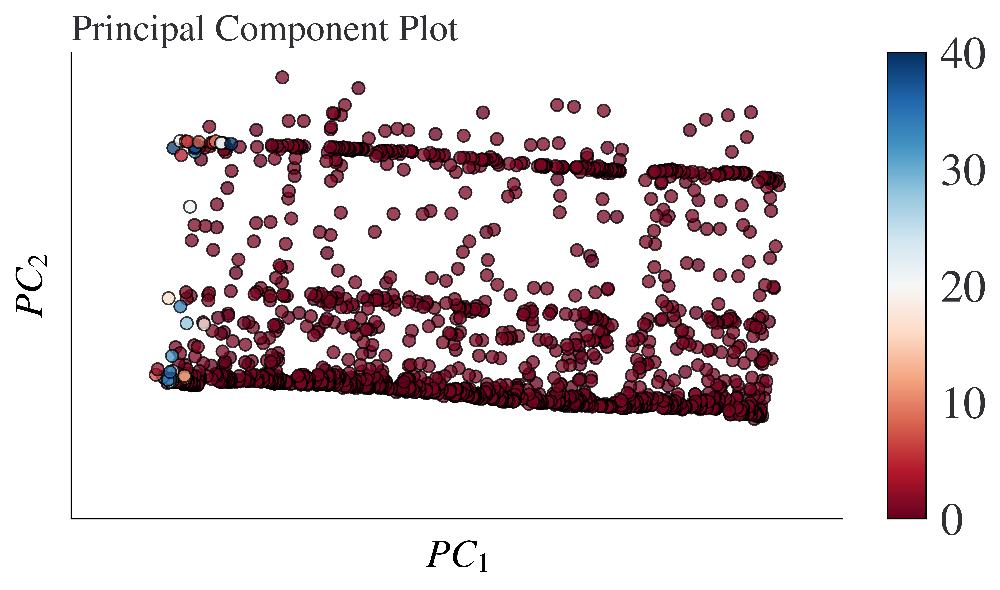

<AxesSubplot:title={'left':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [70]:
visualizer = PCADecomposition(scale=True, center=False, col=y)
visualizer.fit_transform(X,y)
visualizer.show()

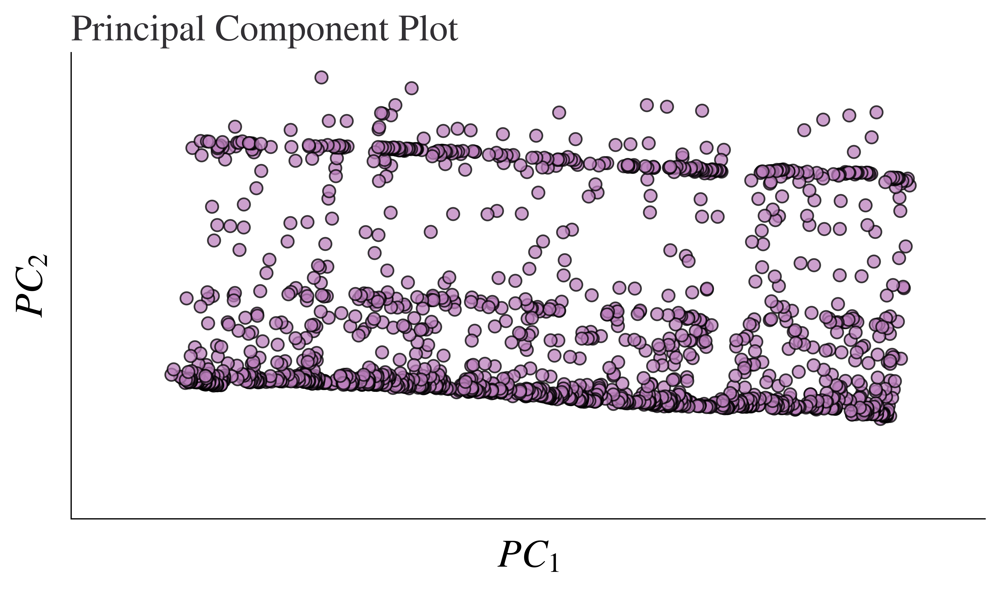

In [73]:

params = {'scale': True, 'color': y}
visualizer = PCADecomposition(**params)
_ =visualizer.fit(X)
_ =visualizer.transform(X)
plt.title('')
_ =visualizer.show()

In [74]:
# Instantiate the visualizer with the Covariance ranking algorithm 
visualizer = Rank1D(features=features, algorithm='shapiro')

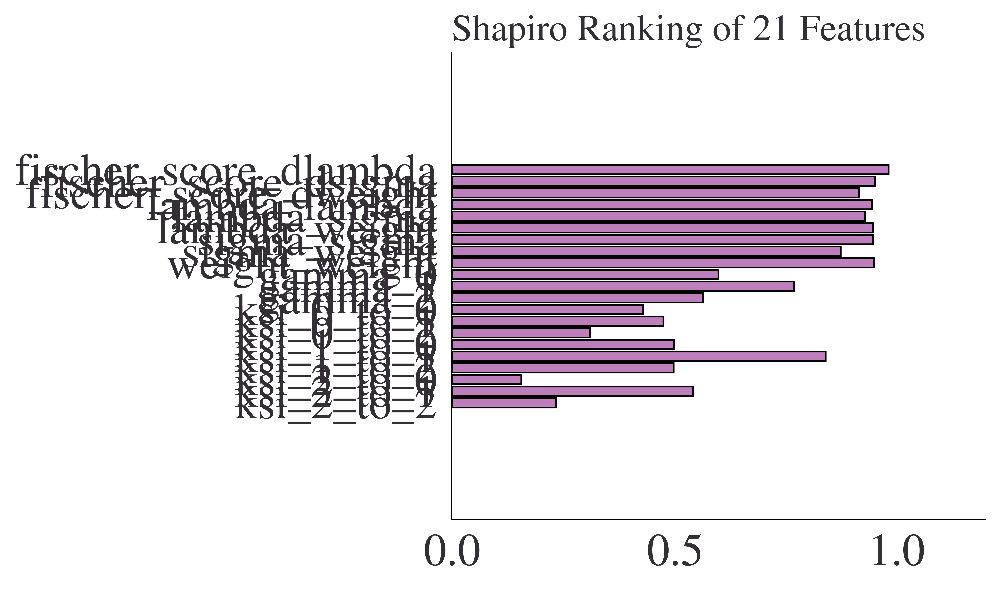

<AxesSubplot:title={'left':'Shapiro Ranking of 21 Features'}>

In [75]:
visualizer.fit(X, y)                # Fit the data to the visualizer
visualizer.transform(X)             # Transform the data
visualizer.show()                   # Finalize and render the figure

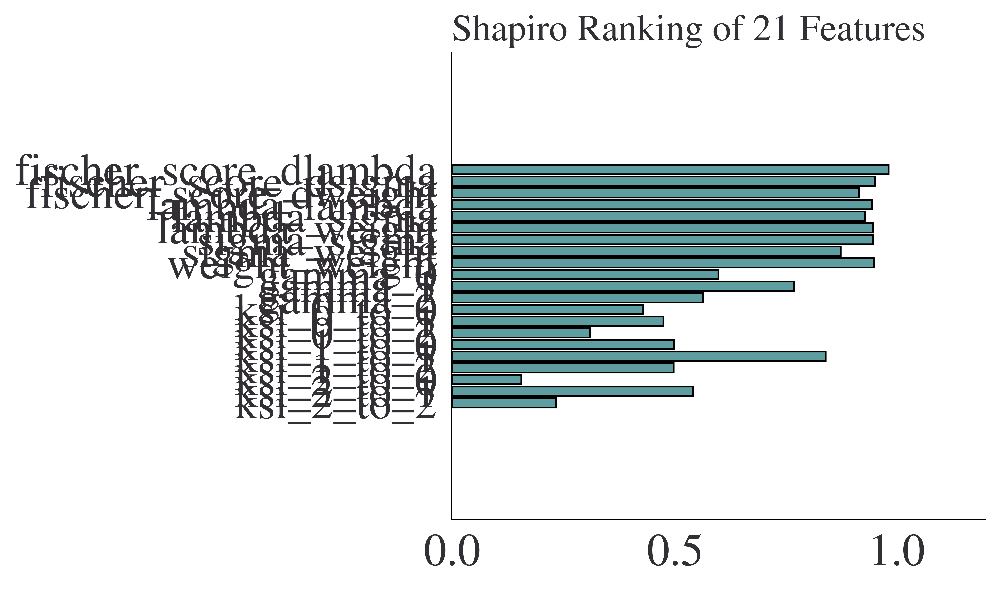

<AxesSubplot:title={'left':'Shapiro Ranking of 21 Features'}>

In [76]:
visualizer = Rank1D(algorithm='shapiro', color=["cadetblue"])

visualizer.fit(X, y)
visualizer.transform(X)
visualizer.show()

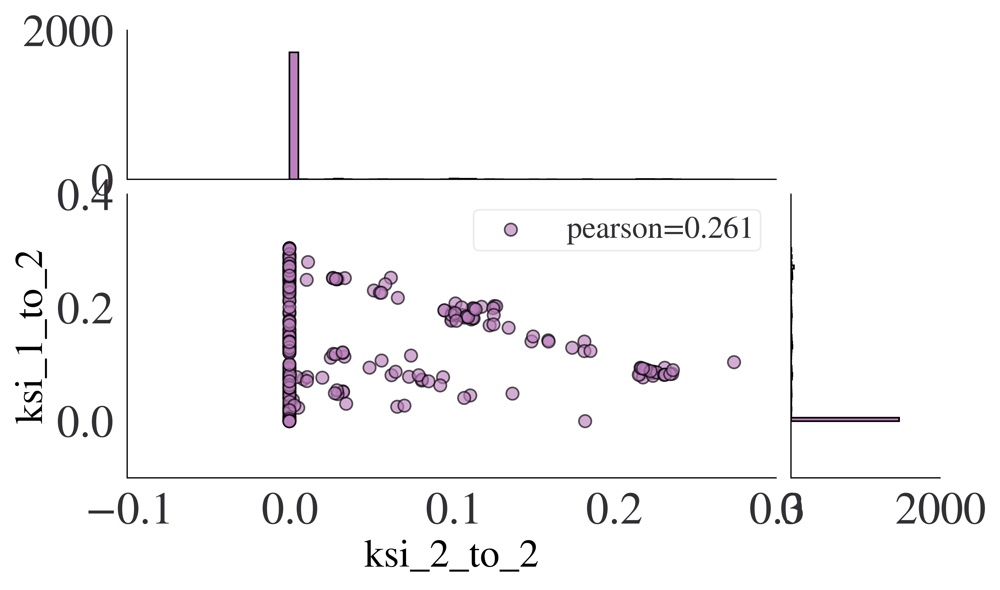

<AxesSubplot:xlabel='ksi_2_to_2', ylabel='ksi_1_to_2'>

In [79]:
from yellowbrick.datasets import load_concrete
from yellowbrick.features import JointPlotVisualizer

# Instantiate the visualizer
visualizer = JointPlotVisualizer(columns=["ksi_2_to_2", "ksi_1_to_2"])

visualizer.fit_transform(X, y)        # Fit and transform the data
visualizer.show()                     # Finalize and render the figure

In [86]:
# Instantiate the visualizer
classes= np.array([0., 1.])
my_title = "RadViz for 21 Features for symbol: "+str(symbols[symbolIdx])
visualizer = RadViz(classes=classes, features=features,  title=my_title,size=(1080, 720))
# Create your custom title

visualizer.fit(X, y)      # Fit the data to the visualizer
visualizer.transform(X)   # Transform the data
visualizer.show()         # Finalize and render the visualizer
# locationFileName = os.path.join('/home/ak/Documents/Research/Papers/figures',str(symbols[symbolIdx])+'_RadViz.png')
# visualizer.show().axvline(color='r')
# visualizer.show(outpath=locationFileName)# Finalize and render the visualizer

YellowbrickValueError: number of specified classes does not match number of unique values in target

<Figure size 1080x720 with 0 Axes>